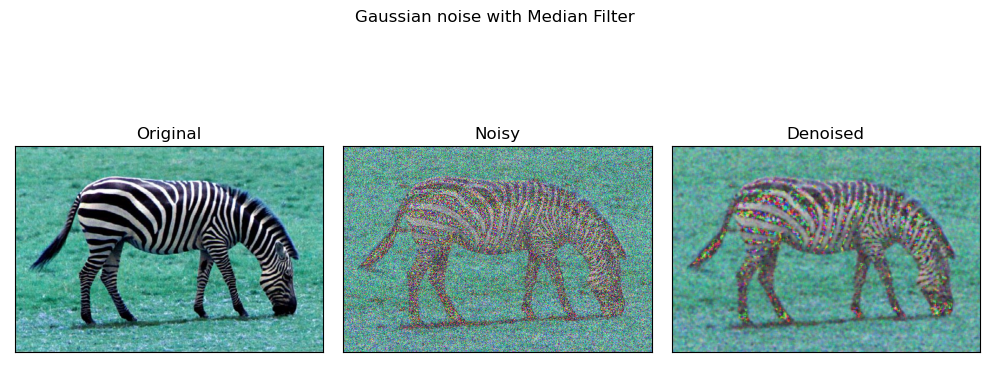

True

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('zebra.png')

#Add Gaussian noise to the image
noise = np.random.normal(0, 50, img.shape)
noisy_img = img + noise

#Apply Median Filter to denoise the image
denoised_img = cv2.medianBlur(noisy_img.astype("uint8"), 5)

# Display the images

output = [img, noisy_img.astype("uint8"), denoised_img.astype("uint8")]
titles = ['Original', 'Noisy', 'Denoised']
fig, axes = plt.subplots(1, 3, figsize=(10, 5))

for i in range(3):
    axes[i].imshow(output[i])
    axes[i].set_title(titles[i])
    axes[i].set_xticks([])
    axes[i].set_yticks([])

fig.tight_layout()
fig.suptitle('Gaussian noise with Median Filter')
plt.show()

# Save the images
cv2.imwrite('original.png', img)
cv2.imwrite('noisy.png', noisy_img.astype("uint8"))
cv2.imwrite('denoised.png', denoised_img.astype("uint8"))




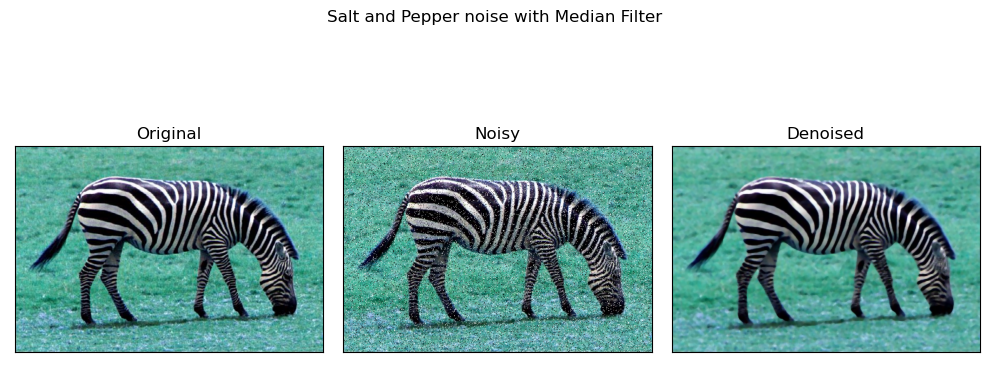

True

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('zebra.png')

noisy_img= cv2.imread('zebra.png')


# Add salt-and-pepper noise to the image
salt_pepper_noise = np.random.rand(*noisy_img.shape[:2])
noisy_img[salt_pepper_noise < 0.05] = 0
noisy_img[salt_pepper_noise > 0.95] = 255


# Apply Median Filter to denoise the image
denoised_img = cv2.medianBlur(img.astype("uint8"), 5)

# Display the images
output = [ img, noisy_img.astype("uint8"), denoised_img.astype("uint8")]
titles = ['Original', 'Noisy', 'Denoised']
fig, axes = plt.subplots(1, 3, figsize=(10, 5))

for i in range(3):
    axes[i].imshow(output[i])
    axes[i].set_title(titles[i])
    axes[i].set_xticks([])
    axes[i].set_yticks([])

fig.tight_layout()
fig.suptitle('Salt and Pepper noise with Median Filter')
plt.show()

# Save the images
cv2.imwrite('original.png', img)
cv2.imwrite('noisy.png', noisy_img.astype("uint8"))
cv2.imwrite('denoised.png', denoised_img.astype("uint8"))




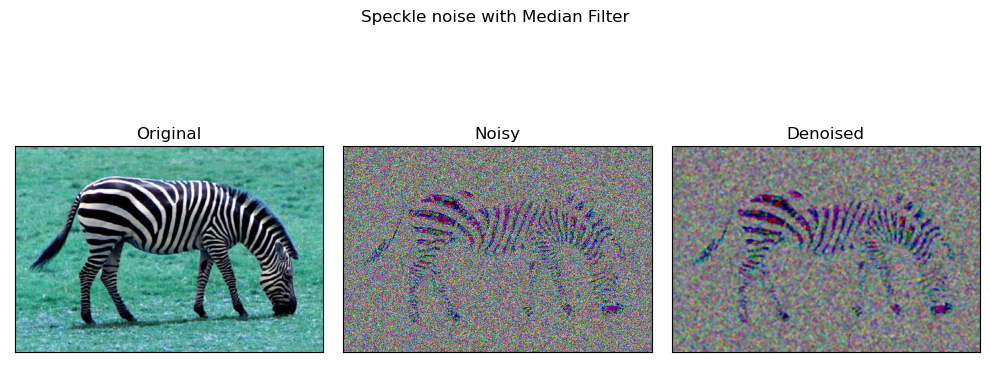

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('zebra.png')


# add speckle noise  
speckle_noise = np.random.normal(0, 50, img.shape)
noisy_img = img + (img * speckle_noise)

# Apply Median Filter to denoise the image
denoised_img = cv2.medianBlur(noisy_img.astype("uint8"), 5)

# Display the images
output = [img, noisy_img.astype("uint8"), denoised_img.astype("uint8")]
titles = ['Original', 'Noisy', 'Denoised']
fig, axes = plt.subplots(1, 3, figsize=(10, 5))

for i in range(3):
    axes[i].imshow(output[i])
    axes[i].set_title(titles[i])
    axes[i].set_xticks([])
    axes[i].set_yticks([])



fig.tight_layout()
fig.suptitle('Speckle noise with Median Filter')
plt.show()


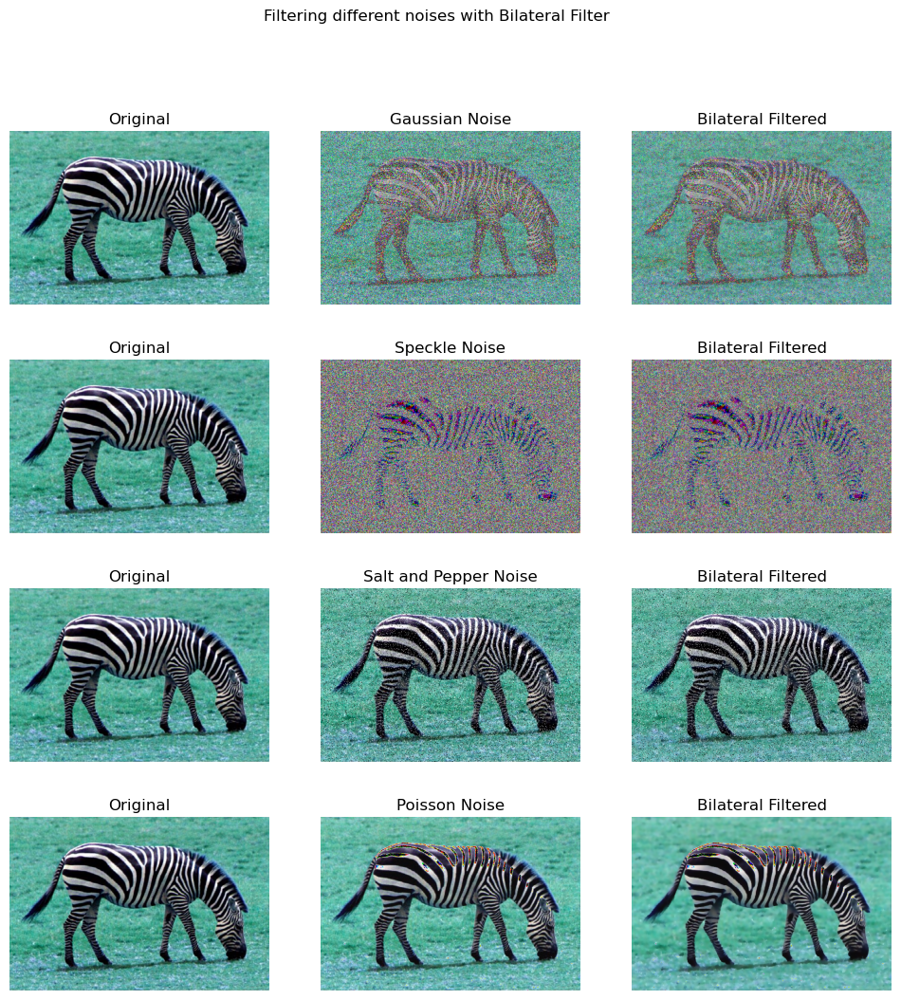

In [116]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('zebra.png')

noisy_img3=np.copy(img)

#Add Gaussian noise to the image
noise = np.random.normal(0, 50, img.shape)
noisy_img1 = img + noise

# Add  speckle  noise to the image
speckle_noise = np.random.normal(0, 50, img.shape)
noisy_img2 = img + (img * speckle_noise) 

# Add salt-and-pepper noise to the image
salt_pepper_noise = np.random.rand(*noisy_img3.shape[:2])
noisy_img3[salt_pepper_noise < 0.05] = 0
noisy_img3[salt_pepper_noise > 0.95] = 255

# Add Poisson noise to the image
lam = 10 # mean of Poisson distribution
noise2 = np.random.poisson(lam, img.shape)
noisy_img4 = img + noise2

#Apply Bilateral Filter to denoise the image
denoised_img1 = cv2.bilateralFilter(noisy_img1.astype("uint8"), 9, 75, 75)
denoised_img2 = cv2.bilateralFilter(noisy_img2.astype("uint8"), 9, 75, 75)
denoised_img3 = cv2.bilateralFilter(noisy_img3.astype("uint8"), 9, 75, 75)
denoised_img4 = cv2.bilateralFilter(noisy_img4.astype("uint8"), 9, 75, 75)

# Display the images
output = [[img, noisy_img1.astype("uint8"), denoised_img1],[img, noisy_img2.astype("uint8"), denoised_img2],[img, noisy_img3.astype("uint8"), denoised_img3],[img, noisy_img4.astype("uint8"), denoised_img4]]
titles = ['Original', 'Noisy', 'Bilateral Filtered']
fig, axes = plt.subplots(4, 3, figsize=(12, 12))

for i in range(4):
    for j in range(3):
        axes[i][j].imshow(output[i][j])
        if i==0 and j==1:
            axes[i][j].set_title('Gaussian Noise')
        elif i==1 and j==1:
            axes[i][j].set_title('Speckle Noise')
        elif i==2 and j==1:
            axes[i][j].set_title('Salt and Pepper Noise')
        elif i==3 and j==1:
            axes[i][j].set_title('Poisson Noise')
        else:
            axes[i][j].set_title(titles[j])
        axes[i][j].axis('off')


fig.suptitle('Filtering different noises with Bilateral Filter')
plt.show()


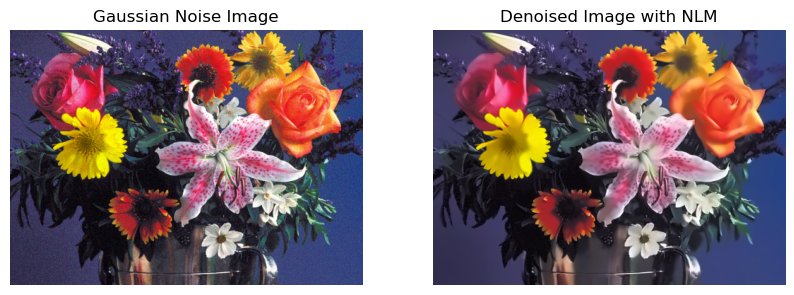

In [128]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('flowers1.png')


#Apply Non-Local Means filter to denoise the image
denoised_img = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the original image in the first subplot
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].set_title('Gaussian Noise Image')
axs[0].axis('off')

# Plot the denoised image in the second subplot
axs[1].imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
axs[1].set_title('Denoised Image with NLM')
axs[1].axis('off')

# Show the figure
plt.show()

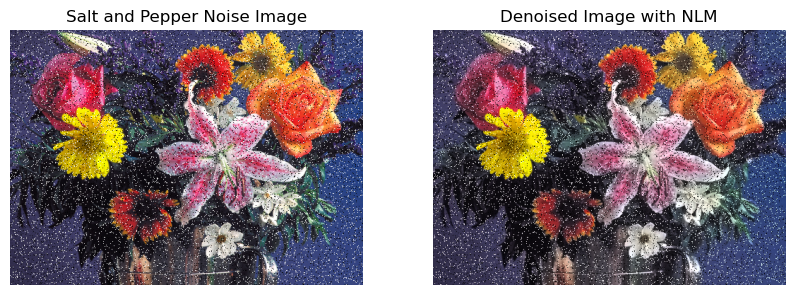

True

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('flowers2.png')

#Apply Non-Local Means filter to denoise the image
denoised_img = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the original image in the first subplot
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].set_title('Salt and Pepper Noise Image')
axs[0].axis('off')

# Plot the denoised image in the second subplot
axs[1].imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
axs[1].set_title('Denoised Image with NLM')
axs[1].axis('off')

# Show the figure
plt.show()

# Save the images

cv2.imwrite('noisy.png',cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
cv2.imwrite('denoised.png', cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))

# # Download the images
# from IPython.display import FileLink

# display(FileLink('noisy.png'))
# display(FileLink('denoised.png'))



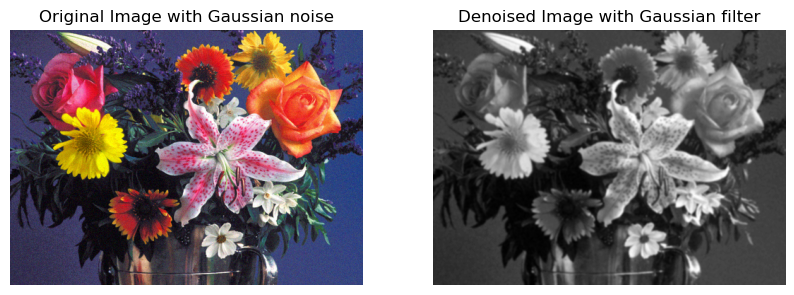

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('flowers1.png')


#load the image
snp_img = cv2.imread('flowers2.png')

# Convert the image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Gaussian filter to the grayscale image
gaussian_img = cv2.GaussianBlur(gray_img, (5, 5), 0)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the original image in the first subplot
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].set_title('Original Image with Gaussian noise')
axs[0].axis('off')

# Plot the denoised image in the second subplot
axs[1].imshow(gaussian_img,cmap='gray')
axs[1].set_title('Denoised Image with Gaussian filter')
axs[1].axis('off')

# Show the figure
plt.show()





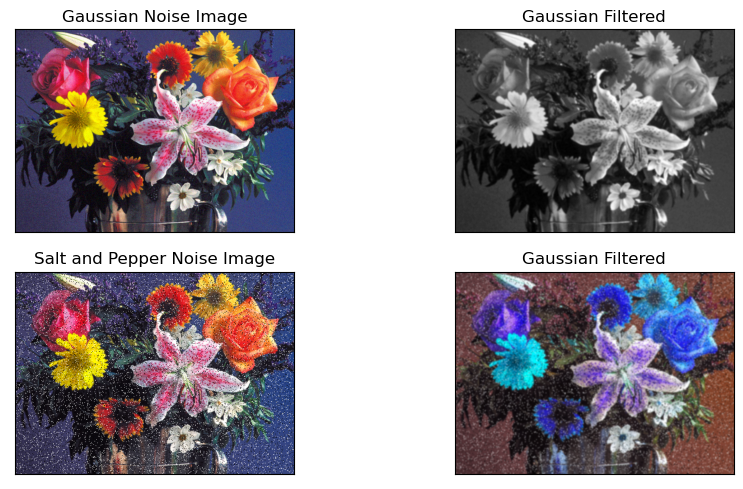

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('flowers1.png')

# Add salt and pepper noise to the image
snp_img = cv2.imread('flowers2.png')

# Convert the image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Gaussian filter to the grayscale image
gaussian_img_gray = cv2.GaussianBlur(gray_img, (5, 5), 0)
gaussian_img_snp = cv2.GaussianBlur(snp_img, (5, 5), 0)

output = [[cv2.cvtColor(img, cv2.COLOR_BGR2RGB), gaussian_img_gray],[cv2.cvtColor(snp_img, cv2.COLOR_BGR2RGB), gaussian_img_snp]]
titles = [['Gaussian Noise Image', 'Gaussian Filtered'],['Salt and Pepper Noise Image','Gaussian Filtered']]
# Create a figure with two subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 5))

for i in range(2):
    for j in range(2):
        axes[i][j].imshow(output[i][j],cmap='gray')
        axes[i][j].set_title(titles[i][j])
        axes[i][j].set_xticks([])
        axes[i][j].set_yticks([])


# Show the figure
fig.tight_layout()
plt.show()

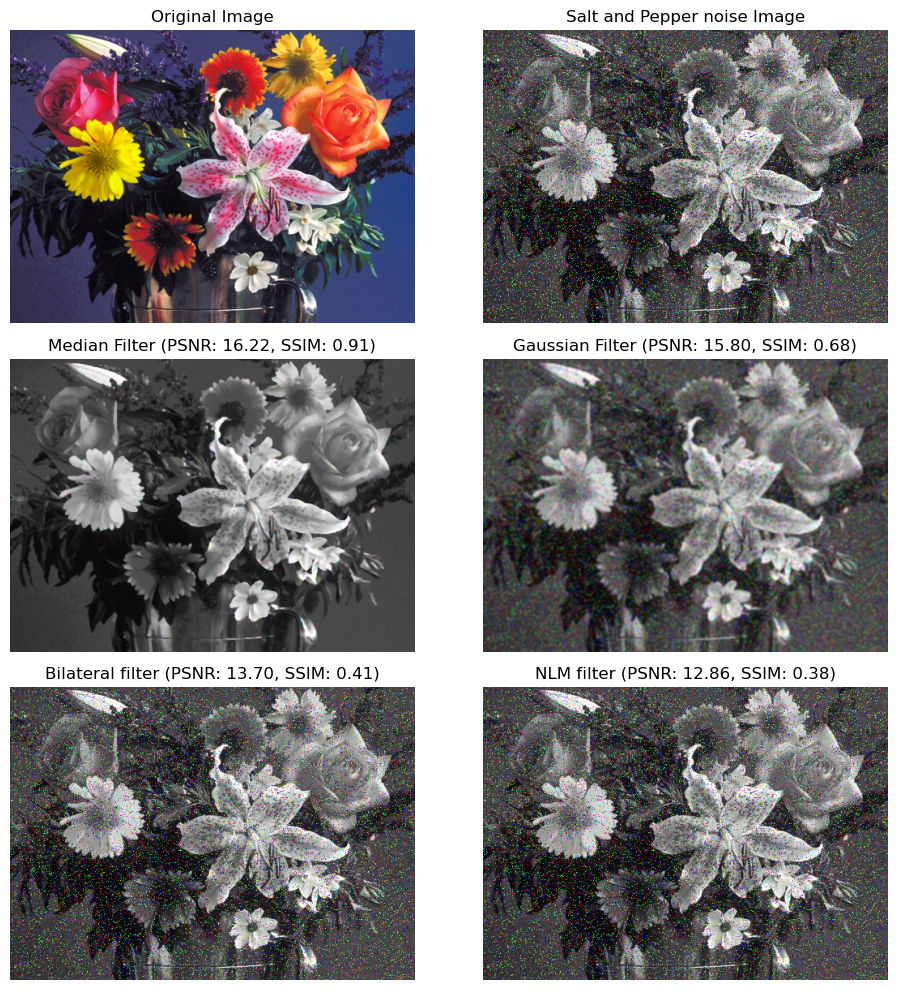

In [52]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('flowers.png')

# Add salt and pepper noise to the image
snp_img = np.copy(img)
snp_img = cv2.cvtColor(snp_img, cv2.COLOR_BGR2GRAY)
snp_img = cv2.cvtColor(snp_img, cv2.COLOR_GRAY2BGR)
snp_img = np.where(np.random.rand(*snp_img.shape) < 0.05, 0, snp_img)
snp_img = np.where(np.random.rand(*snp_img.shape) > 0.95, 255, snp_img)

# Denoise the image using Median filter
median_img = cv2.medianBlur(snp_img, 3)

# Denoise the image using Gaussian filter
gaussian_img = cv2.GaussianBlur(snp_img, (5, 5), 0)

# Denoise the image using Bilateral filter
bilateral_img = cv2.bilateralFilter(snp_img, 9, 75, 75)

# Apply NLM filter to the color image
nlm_img = cv2.fastNlMeansDenoisingColored(snp_img, None, 10, 10, 7, 21)

# Calculate PSNR and SSIM for each denoised image
psnr_median = peak_signal_noise_ratio(img, median_img)
ssim_median = structural_similarity(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(median_img, cv2.COLOR_BGR2GRAY))

psnr_gaussian = peak_signal_noise_ratio(img, gaussian_img)
ssim_gaussian = structural_similarity(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(gaussian_img, cv2.COLOR_BGR2GRAY))

psnr_bilateral = peak_signal_noise_ratio(img, bilateral_img)
ssim_bilateral = structural_similarity(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(bilateral_img, cv2.COLOR_BGR2GRAY))

# psnr_nlm = psnr(img, nlm_img)
# ssim_nlm = ssim(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(nlm_img, cv2.COLOR_BGR2GRAY), multichannel=False)
psnr_nlm = peak_signal_noise_ratio(img, nlm_img)
ssim_nlm = structural_similarity(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(nlm_img, cv2.COLOR_BGR2GRAY))

# Create a figure with four subplots
fig, axs = plt.subplots(3, 2, figsize=(10, 10))

# Plot the original image in the first subplot
axs[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

# Plot the noisy image in the second subplot
axs[0, 1].imshow(cv2.cvtColor(snp_img, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title('Salt and Pepper noise Image')
axs[0, 1].axis('off')

# Plot the denoised images in the third and fourth subplots
axs[1, 0].imshow(cv2.cvtColor(median_img, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title(f'Median Filter (PSNR: {psnr_median:.2f}, SSIM: {ssim_median:.2f})')
axs[1, 0].axis('off')

axs[1, 1].imshow(cv2.cvtColor(gaussian_img, cv2.COLOR_BGR2RGB))
axs[1, 1].set_title(f'Gaussian Filter (PSNR: {psnr_gaussian:.2f}, SSIM: {ssim_gaussian:.2f})')
axs[1, 1].axis('off')

axs[2, 0].imshow(cv2.cvtColor(nlm_img, cv2.COLOR_BGR2RGB))
axs[2, 0].set_title(f'Bilateral filter (PSNR: {psnr_bilateral:.2f}, SSIM: {ssim_bilateral:.2f})')
axs[2, 0].axis('off') 

axs[2, 1].imshow(cv2.cvtColor(nlm_img, cv2.COLOR_BGR2RGB))
axs[2, 1].set_title(f'NLM filter (PSNR: {psnr_nlm:.2f}, SSIM: {ssim_nlm:.2f})')
axs[2, 1].axis('off')
# Show the figure
fig.tight_layout()
plt.show()


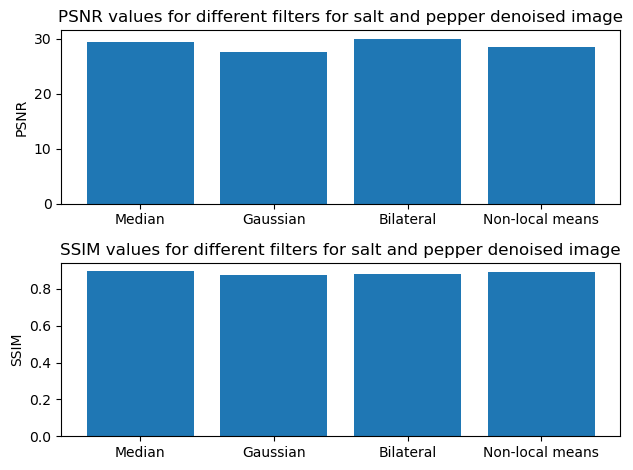

In [13]:
# Create arrays with PSNR and SSIM values
psnr_values = [psnr_median, psnr_gaussian, psnr_bilateral, psnr_nlm]
ssim_values = [ssim_median, ssim_gaussian, ssim_bilateral, ssim_nlm]
x_labels = ['Median', 'Gaussian', 'Bilateral', 'Non-local means']
# Create a bar chart for PSNR values
plt.subplot(2, 1, 1)
plt.bar(x_labels, psnr_values)
plt.title('PSNR values for different filters for salt and pepper denoised image')
plt.ylabel('PSNR')

# Create a bar chart for SSIM values
plt.subplot(2, 1, 2)
plt.bar(x_labels, ssim_values)
plt.title('SSIM values for different filters for salt and pepper denoised image')
plt.ylabel('SSIM')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

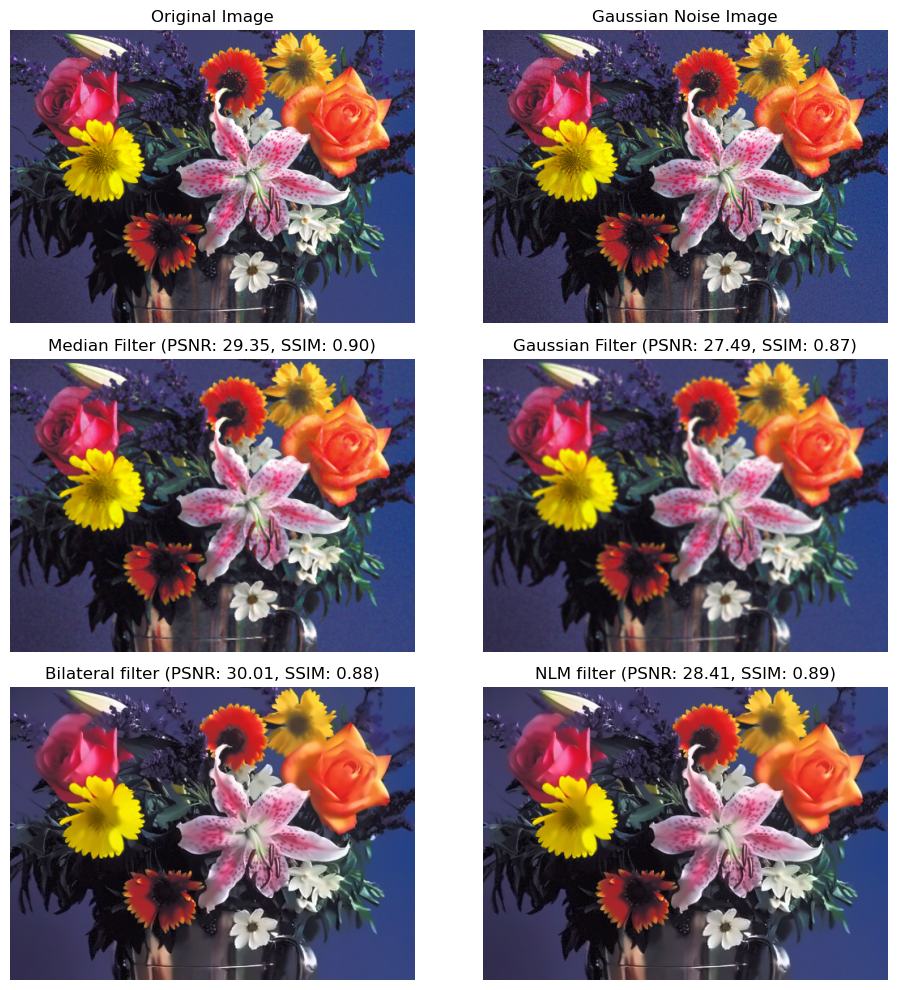

True

In [11]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import matplotlib.pyplot as plt
from IPython.display import Image

# Load the image

img=cv2.imread('flowers.png')
img1 = cv2.imread('flowers1.png')


# Denoise the image using Median filter
median_img = cv2.medianBlur(img1, 3)

# Denoise the image using Gaussian filter
gaussian_img = cv2.GaussianBlur(img1, (5, 5), 0)

# Denoise the image using Bilateral filter
bilateral_img = cv2.bilateralFilter(img1, 9, 75, 75)

# Apply NLM filter to the color image
nlm_img = cv2.fastNlMeansDenoisingColored(img1, None, 10, 10, 7, 21)

# Calculate PSNR and SSIM for each denoised image
psnr_median = peak_signal_noise_ratio(img, median_img)
ssim_median = structural_similarity(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(median_img, cv2.COLOR_BGR2GRAY))

psnr_gaussian = peak_signal_noise_ratio(img, gaussian_img)
ssim_gaussian = structural_similarity(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(gaussian_img, cv2.COLOR_BGR2GRAY))

psnr_bilateral = peak_signal_noise_ratio(img, bilateral_img)
ssim_bilateral = structural_similarity(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(bilateral_img, cv2.COLOR_BGR2GRAY))

# psnr_nlm = psnr(img, nlm_img)
# ssim_nlm = ssim(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(nlm_img, cv2.COLOR_BGR2GRAY), multichannel=False)
psnr_nlm = peak_signal_noise_ratio(img, nlm_img)
ssim_nlm = structural_similarity(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(nlm_img, cv2.COLOR_BGR2GRAY))

# Create a figure with four subplots
fig, axs = plt.subplots(3, 2, figsize=(10, 10))

# Plot the original image in the first subplot
axs[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

# Plot the noisy image in the second subplot
axs[0, 1].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title('Gaussian Noise Image')
axs[0, 1].axis('off')

# Plot the denoised images in the third and fourth subplots
axs[1, 0].imshow(cv2.cvtColor(median_img, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title(f'Median Filter (PSNR: {psnr_median:.2f}, SSIM: {ssim_median:.2f})')
axs[1, 0].axis('off')

axs[1, 1].imshow(cv2.cvtColor(gaussian_img, cv2.COLOR_BGR2RGB))
axs[1, 1].set_title(f'Gaussian Filter (PSNR: {psnr_gaussian:.2f}, SSIM: {ssim_gaussian:.2f})')
axs[1, 1].axis('off')

axs[2, 0].imshow(cv2.cvtColor(nlm_img, cv2.COLOR_BGR2RGB))
axs[2, 0].set_title(f'Bilateral filter (PSNR: {psnr_bilateral:.2f}, SSIM: {ssim_bilateral:.2f})')
axs[2, 0].axis('off') 

axs[2, 1].imshow(cv2.cvtColor(nlm_img, cv2.COLOR_BGR2RGB))
axs[2, 1].set_title(f'NLM filter (PSNR: {psnr_nlm:.2f}, SSIM: {ssim_nlm:.2f})')
axs[2, 1].axis('off')
# Show the figure
fig.tight_layout()
plt.show()
# Save the image to a file
cv2.imwrite('nlm_image.png', nlm_img)


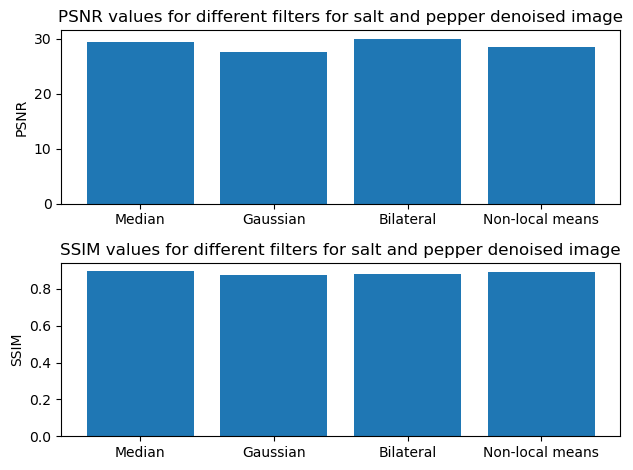

In [12]:
# Create arrays with PSNR and SSIM values
psnr_values = [psnr_median, psnr_gaussian, psnr_bilateral, psnr_nlm]
ssim_values = [ssim_median, ssim_gaussian, ssim_bilateral, ssim_nlm]
x_labels = ['Median', 'Gaussian', 'Bilateral', 'Non-local means']
# Create a bar chart for PSNR values
plt.subplot(2, 1, 1)
plt.bar(x_labels, psnr_values)
plt.title('PSNR values for different filters for salt and pepper denoised image')
plt.ylabel('PSNR')

# Create a bar chart for SSIM values
plt.subplot(2, 1, 2)
plt.bar(x_labels, ssim_values)
plt.title('SSIM values for different filters for salt and pepper denoised image')
plt.ylabel('SSIM')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()
